# ENRON Emails - Exploratory Data Analysis


In [18]:
## imports
import sys
import altair as alt
import warnings
warnings.filterwarnings('ignore')
alt.renderers.enable('default')


RendererRegistry.enable('default')

In [19]:
import pandas as pd
from matplotlib import pyplot as plt

from features import ShallowFeaures, DeepFeatures
from eda import EDA


# 1. READING DATA and Creating Shallow & Deep Features for analysis

In [20]:
df = pd.read_csv('./data/enron_test.csv')

print(df.shape)

(1000, 6)


# 1.1 ) Creating Shallow Features from dataframe 

In [21]:
sfeature = ShallowFeaures.from_dataframe(df)
sfeature.columns

Index(['Date', 'From', 'To', 'Subject', 'content', 'new_date',
       'IsFROMEmailDomainENRON', 'IsTOEmailDomainENRON', 'FROM_EMAIL_DOMAIN',
       'TO_EMAIL_DOMAIN', 'FROM_EmailDomainType', 'TO_EmailDomainType',
       'EMAIL_TYPE', 'EMAIL_MONTH', 'EMAIL_YEAR', 'EMAIL_MONTH_YEAR',
       'EMAIL_DATE', 'EMAIL_HEADER', 'EMAIL_BODY', 'CLEAN_BODY', 'NO_OF_LINES',
       'EMAIL_LENGTH', 'WORD_COUNT'],
      dtype='object')

# 1.2 ) Creating Deep Features from dataframe

In [22]:
deepfeature = DeepFeatures.from_dataframe(sfeature)
deepfeature.data.columns

### deep feature dataframe created and saving it for future use
deepfeature.data.to_csv('./data/enron_test_with_features.csv',index=False)

### Email Corpus has been generated and saved as EMAIL_CORPUS for future purpose
EMAIL_CORPUS = deepfeature.email_corpus
NEW_EMAIL_CORPUS = deepfeature.new_email_corpus
REPLY_EMAIL_CORPUS = deepfeature.reply_email_corpus
FORWARD_EMAIL_CORPUS = deepfeature.forward_email_corpus



### Document Term Matrix created and saved as DTM for future purpose
DTM = deepfeature.DTM
### Count Vectorizer created and saved as CV for future purpose
CV = deepfeature.CV

# 2: Data Analysis

# 2.1 ) Visualzing count of emails over years

In [23]:
dfeature = pd.read_csv('./data/enron_test_with_features.csv')
dfeature['EMAIL_DATE']=pd.to_datetime(dfeature['EMAIL_DATE'])
schart = alt.Chart(dfeature)
schart.mark_bar().encode(
    x='EMAIL_YEAR:O',
    y='count()',
    color='count()',
).properties(
    width=400
)

alt.Chart(...)

# 2.2 ) Simple Sentiment Analysis (with Polarity and Subjectivity)

For preliminary understanding TextBlob is used to understand "Polarity" and "Subjectivity" accross emails.
Looking at below chart ('Sentiment Polarity over years' and 'Sentiment Subjectivity over years'), it is clear that sentiments started fluctuating in year 2000.

In following section, we can deep dive to understand year 2000 and 2001 closely


In [24]:
sentiment = alt.Chart(dfeature)
pol_chart = sentiment.mark_line().encode(
    x=alt.X('EMAIL_DATE:T',axis=alt.Axis(tickMinStep = 20, labelAngle=-45)),
    y='mean(SENTIMENT_POLARIT)'
).properties(
    title = "Sentiment Polarity over years",
    width=800
)
sub_chart = sentiment.mark_line().encode(
    x=alt.X('EMAIL_DATE:T',axis=alt.Axis(tickMinStep = 20, labelAngle=-45)),
    y='mean(SENTIMENT_SUBJECTIVITY)'
).properties(
    title = "Sentiment Subjectivity over years",
    width=800
)
alt.vconcat(pol_chart,sub_chart)

alt.VConcatChart(...)

# 2.3 ) Sentiment Analysis between 2000 and 2001 

It's more clear that in year 2000 and 2001, sentiment polarity and subjectivity was fluctuating around 0.1 amd 0.3 respectively with positive and negative spikes. 

In [25]:
dfeature = dfeature[dfeature['EMAIL_DATE']>'1995-01-01'].copy()
sentiment = alt.Chart(dfeature)
pol_chart = sentiment.mark_line().encode(
    x=alt.X('EMAIL_DATE:T',axis=alt.Axis(tickMinStep = 20, labelAngle=-45)),
    y='mean(SENTIMENT_POLARIT)'
).properties(
    title = "Sentiment Polarity over years",
    width=800
)
sub_chart = sentiment.mark_line().encode(
    x=alt.X('EMAIL_DATE:T',axis=alt.Axis(tickMinStep = 20, labelAngle=-45)),
    y='mean(SENTIMENT_SUBJECTIVITY)'
).properties(
    title = "Sentiment Subjectivity over years",
    width=800
)
alt.vconcat(pol_chart,sub_chart)

alt.VConcatChart(...)

# 2.4 ) Sender Domain Sentiment Rate

To understand sender better as he is initiated of email chain, it's better to plot Sender Domain Sentiment Rate. It clearly display that all domain senders are floating between polarity 0 to 0.25 and subjectivity 0.3 to 0.5

In [26]:
sender_sentiment_rate = EDA.sender_sentiment_rate(dfeature)

sender_sentiment_rate_chart = alt.Chart(sender_sentiment_rate)
sender_sentiment_rate_chart.mark_point().encode(
    x='SENTIMENT_POLARIT_MEAN',
    y='SENTIMENT_SUBJECTIVITY_MEAN',
    color='SENDER_DOMAIN'
).properties(
    title = "Sender Sentiment Rate",
    width=600
)


alt.Chart(...)

# 2.5 ) ENRON sender sentiment rate

Looking at below charts it's clear that ENRON senders are having very low polarity and subjectivity score compare to other senders. It's clear display neagtive and opinion dominated envrionment 

In [27]:
sender_sentiment_rate = EDA.sender_sentiment_rate(dfeature)
sender_sentiment_rate_v2 = sender_sentiment_rate[sender_sentiment_rate['SENDER_DOMAIN']=='enron.com'].copy()


sender_sentiment_rate_chart_v2 = alt.Chart(sender_sentiment_rate_v2)
sender_sentiment_rate_chart_v2.mark_point().encode(
    x=alt.X('SENTIMENT_POLARIT_MEAN',title='<-------------- Negative ------------- Positive -------------->'),
    y=alt.X('SENTIMENT_SUBJECTIVITY_MEAN',title='<---- Facts ------------- Opinion ---->'),
    color='SENDER_DOMAIN'
).properties(
    title = "Sender Sentiment Rate",
    width=600
)


alt.Chart(...)


# 2.6 ) Top 5 Email Sender


It's clearly display only one sender and our data is imbalanced to do any analysis on senders as it only reflect (mostly) one person email pattern.

In [28]:
top_sender = EDA.top_sender(dfeature)

sender_chart = alt.Chart(top_sender)
sender_chart.mark_bar().encode(
    x=alt.X('SENDER_NAME',axis=alt.Axis(labelAngle=-45)),
    y='EMAIL_COUNT',
    color='EMAIL_COUNT:N'
).properties(
    title = "Top 5 Email Sender",
    width=400
)


alt.Chart(...)

# 2.7 ) Top 5 Email Receiver

It's a balanced data set but having very low volume.

In [29]:
top_receiver = EDA.top_receiver(dfeature)

receiver_chart = alt.Chart(top_receiver)
receiver_chart.mark_bar().encode(
    x=alt.X('RECEIVER_NAME',axis=alt.Axis(labelAngle=-45)),
    y='EMAIL_COUNT',
    color='EMAIL_COUNT:N'
).properties(
    title = "Top 5 Email Receiver",
    width=600
)



alt.Chart(...)

# 2.8 ) Top Sender-Receiver Pair

as data was low or more skewed for sender and receiver, below chart is plaotted to under any dominated pair (sender -receiver).

In [30]:
top_sen_rec_pair = EDA.top_sender_receiver_pair(dfeature,top_count=20)


top_sen_rec_pair_chart = alt.Chart(top_sen_rec_pair)
top_sen_rec_pair_chart.mark_bar().encode(
    x=alt.X('RECEIVER_NAME',axis=alt.Axis(labelAngle=-45)),
    y='EMAIL_COUNT',
    color='SENDER_NAME'
).properties(
    title = "Top 20 Email Sender-Receiver Pair",
    width=600
)

alt.Chart(...)

# 2.9 ) Top Sender-Receiver DOMAIN Pair

This is to understand email exchange between domains. (internal vs external emails)

In [31]:
top_sen_rec_domain_pair = EDA.top_sender_receiver_domain_pair(dfeature,top_count=50)

print(top_sen_rec_domain_pair.shape)
top_domain_pair_chart = alt.Chart(top_sen_rec_domain_pair)
top_domain_pair_chart.mark_point().encode(
    x=alt.X('TO_EMAIL_DOMAIN',axis=alt.Axis(labelAngle=-45)),
    y='FROM_EMAIL_DOMAIN',
    color='EMAIL_COUNT:N'
).properties(
    title = "Top 50 Email Sender-Receiver Domain Pair",
    width=600
)

(50, 3)


alt.Chart(...)

# 2.10 ) Top Enron(Sender) -Receiver DOMAIN Pair

Above chart lead to an intution that how many emails exchhnaged between Enron(Sender) and other external domains.
It clearly display external domain like 'hotmail.com,'austinits.com' and 'rr.com' on top category. As a second iteration, it will be worth while to deep dive on those specific domains emails to understand "sensitive information exchanges".

In [32]:
top_sen_rec_domain_pair_v2 = EDA.top_sender_receiver_domain_pair(dfeature,top_count=10)
top_domain_pair_chart_v2 = alt.Chart(top_sen_rec_domain_pair_v2)
top_domain_pair_chart_v2.mark_bar().encode(
    x=alt.X('TO_EMAIL_DOMAIN',axis=alt.Axis(labelAngle=-45)),
    y='EMAIL_COUNT',
    color='EMAIL_COUNT:N'
).properties(
    title = "Top 10 Email Sender(Enron)-Receiver Domain Pair",
    width=600
)

alt.Chart(...)

# 2.11 ) WordCloud visulization with top 50 words to understand words used in below 4 corpus
1)'Overall Email corpus' 
2)'New Email',
3)'Reply Email' and
4)'Forward Email'

Top 50 words in overall Email Corpus
[('phillip', 683), ('gas', 341), ('need', 242), ('new', 222), ('time', 208), ('project', 197), ('power', 194), ('loan', 190), ('allen', 185), ('enron', 182), ('know', 178), ('image', 175), ('mail', 173), ('like', 172), ('email', 167), ('market', 162), ('hou', 161), ('price', 151), ('work', 150), ('cost', 150), ('week', 141), ('today', 139), ('let', 137), ('use', 137), ('construction', 130), ('prices', 128), ('plan', 127), ('list', 127), ('land', 127), ('want', 126), ('questions', 123), ('meeting', 120), ('position', 113), ('think', 112), ('west', 112), ('day', 110), ('costs', 110), ('lot', 108), ('year', 106), ('attached', 105), ('access', 104), ('information', 102), ('desk', 100), ('socal', 100), ('daily', 99), ('loans', 99), ('thank', 98), ('good', 98), ('going', 98), ('jeff', 98)]
**************************************************


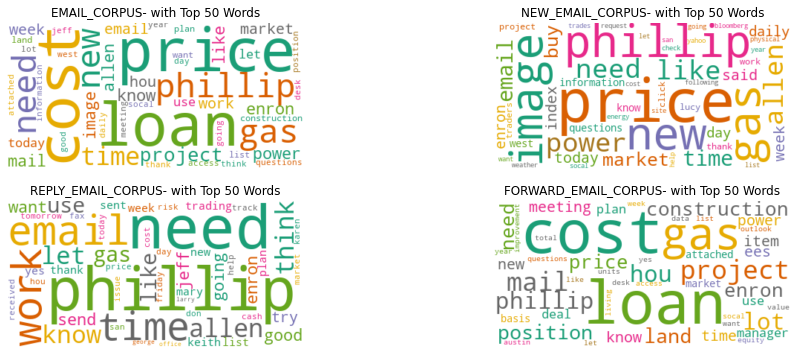

In [33]:

print('Top 50 words in overall Email Corpus')
print(EDA.top_words_used_in_communication(EMAIL_CORPUS,top_count=50))

print('*'*50)
plt.rcParams['figure.figsize'] = [16,6]

corpus = [EMAIL_CORPUS,NEW_EMAIL_CORPUS,REPLY_EMAIL_CORPUS,FORWARD_EMAIL_CORPUS]
name =['EMAIL_CORPUS','NEW_EMAIL_CORPUS','REPLY_EMAIL_CORPUS','FORWARD_EMAIL_CORPUS']

for idx, crps in enumerate(corpus):
    wc = EDA.get_topwords_wordcloud(crps,top_count=50)
    plt.subplot(2,2,idx+1)
    plt.imshow(wc,interpolation='bilinear')
    plt.axis('off')
    plt.title(name[idx]+'- with Top 50 Words')
plt.show()


# 3.0 ) Topic Modeling

Using LDA to create topics.
DTM - Document Term Matrix which is created at the time of Deep Feature creation.
CV - Count Vectorizer which is created at the time of Deep Feature creation.

______________________
- LDA tried with range of topics (2,3,4) to understand where it fits more.
- Looking at LDA topic modeling results below , we can proceed with preliminary assumptions of 3 topics. However more clean-up and data manupulation is recommended to get better results on next iteration. 
- We can also increase number of passes to let LDA find hidden elements more accurately.


In [34]:
EDA.topic_modeling_with_LDA(DTM,CV)

TOPIC Count- 2 :  #*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*
--------------------------------------------------
(0, '0.005*"phillip" + 0.003*"gas" + 0.002*"image" + 0.002*"image image" + 0.002*"mail" + 0.002*"power" + 0.002*"new" + 0.002*"loan" + 0.002*"time" + 0.002*"price"')
--------------------------------------------------
(1, '0.005*"phillip" + 0.002*"need" + 0.002*"hou" + 0.002*"know" + 0.002*"gas" + 0.002*"position" + 0.002*"new" + 0.002*"project" + 0.001*"time" + 0.001*"manager"')
TOPIC Count- 3 :  #*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*#*
--------------------------------------------------
(0, '0.006*"phillip" + 0.003*"image" + 0.003*"gas" + 0.003*"image image" + 0.003*"position" + 0.002*"need" + 0.002*"new" + 0.002*"time" + 0.002*"yes" + 0.002*"list"')
--------------------------------------------------
(1, '0.003*"phillip" + 0.003*"loan" + 0.002*"mail" + 0.002*"

# 4.0 ) Conclusion & Next Step

- Above analyis clearly indicating to deep dive on below area/use cases
1) Further Sentiment analysis (may be at sentence level) to understand how emails sentences are scattered accross sentiments. Analysis can be further enahnced into use case where machine learning model can be developed to understand  corporate email sentiments as it is written by someone. Model can provide guidance or alert to email writer on written sentence before it is being sent.

2) While cleaning data, came accross lot of PII information (like Phone#, IP addresses, passwords, etc) and it will be good use case to understand emails with PII information. Machine Learning model can be developed to indetify such emails and increase protection on PII data.

3) Email Corpus and specifically Forward Email Type corpus can be further explored to understand sensitive information exchange with internal and external email addressed. With this data model can be delveoped to flag such external email communication.

4) Topic modeling can be further enahcned to categorize each emails. Kmean can be leveraged to underastand cluster accross email corpus.

5) Overal this email data with adding deep featured can be leveraged to 
 - protect PII information
 - Sensitive Email exchanges to external email addressess,
 - Sentence Sensitivity and over all email perception guidance to writer
 